<div style="text-align:center"><img src="https://miro.medium.com/v2/resize:fit:1100/format:webp/0*PavIGBu7ofDoQqp4.jpg" alt="Descripción de la imagen" width="300"/>


### <div style="text-align:center">**Predicción del Riesgo en la Aprobación de Tarjetas de Crédito** 💳
***

In [1]:
# Importación de las librerias a utilizar 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
# Exportación de las bases de datos , creación de dataframes y visualización de las primeras filas 
apl_record= pd.read_csv(r"C:\Users\karen\Desktop\BOOTHCAMP\R-DS_KAREN_COPIA\2-Data_Analysis\Entregas\EDA\EDA CREDIT_CARD_PREDICTION_KF\DATA\application_record.csv")
application= apl_record
apl_record.head(3)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0


In [3]:
cred_record= pd.read_csv(r"C:\Users\karen\Desktop\BOOTHCAMP\R-DS_KAREN_COPIA\2-Data_Analysis\Entregas\EDA\EDA CREDIT_CARD_PREDICTION_KF\DATA\credit_record.csv")
credit= cred_record
cred_record.head(3)

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0


In [4]:
# Revisamos los tipo de datos que tenemos en cada dataframe, la cantidad de valores nulos y
# estudiamos las estructuras de cada dataframe

apl_record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [5]:
apl_record.describe().T.style.background_gradient(cmap='BuPu')

,count,mean,std,min,25%,50%,75%,max
ID,438557.000000,6022176.269842,571637.023257,5008804.000000,5609375.000000,6047745.000000,6456971.000000,7999952.000000
CNT_CHILDREN,438557.000000,0.427390,0.724882,0.000000,0.000000,0.000000,1.000000,19.000000
AMT_INCOME_TOTAL,438557.000000,187524.286010,110086.853066,26100.000000,121500.000000,160780.500000,225000.000000,6750000.000000
DAYS_BIRTH,438557.000000,-15997.904649,4185.030007,-25201.000000,-19483.000000,-15630.000000,-12514.000000,-7489.000000
DAYS_EMPLOYED,438557.000000,60563.675328,138767.799647,-17531.000000,-3103.000000,-1467.000000,-371.000000,365243.000000
FLAG_MOBIL,438557.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
FLAG_WORK_PHONE,438557.000000,0.206133,0.404527,0.000000,0.000000,0.000000,0.000000,1.000000
FLAG_PHONE,438557.000000,0.287771,0.452724,0.000000,0.000000,0.000000,1.000000,1.000000
FLAG_EMAIL,438557.000000,0.108207,0.310642,0.000000,0.000000,0.000000,0.000000,1.000000
CNT_FAM_MEMBERS,438557.000000,2.194465,0.897207,1.000000,2.000000,2.000000,3.000000,20.000000


In [6]:
cred_record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [7]:
cred_record.duplicated().sum()

0

### **Analisis de valores Faltantes**

---

In [8]:
apl_record.isnull().sum()

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

In [9]:
# Observamos que existen 134,203 valores nulos en la columna OCCUPATION_TYPE- 30% del total de
# los datos. Filtramos las filas que contienen esos nulos para determinar las acciones a realizar
apl_record[apl_record.isnull().any(axis=1)]


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438549,6840098,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438550,6840100,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438551,6840102,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438552,6840104,M,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0


In [10]:
# Empezamos revisando las columnas relaciones con los valores nulos
apl_record["NAME_INCOME_TYPE"].unique()

array(['Working', 'Commercial associate', 'Pensioner', 'State servant',
       'Student'], dtype=object)

In [11]:
apl_record["OCCUPATION_TYPE"].unique()

array([nan, 'Security staff', 'Sales staff', 'Accountants', 'Laborers',
       'Managers', 'Drivers', 'Core staff', 'High skill tech staff',
       'Cleaning staff', 'Private service staff', 'Cooking staff',
       'Low-skill Laborers', 'Medicine staff', 'Secretaries',
       'Waiters/barmen staff', 'HR staff', 'Realty agents', 'IT staff'],
      dtype=object)

In [12]:
# Observamos una parte de los valores nulos correspoden a personas pensionadas, por lo que en 
# OCCUPATION_TYPE rellenaremos con la categoria Pensioner para identificarlos como tipo especial 
# hacemos lo mismo con Student y State servant
# asignando el valor utilizando df.loc[condición, columna] = valor.

apl_record.loc[apl_record["NAME_INCOME_TYPE"]== "Pensioner", "OCCUPATION_TYPE"]= "Pensioner"
apl_record.loc[apl_record["NAME_INCOME_TYPE"]== "Student", "OCCUPATION_TYPE"]= "Pensioner"
apl_record.loc[apl_record["NAME_INCOME_TYPE"]== "State servant", "OCCUPATION_TYPE"]= "State servant"

In [13]:
apl_record[apl_record.isnull().any(axis=1) & (apl_record["NAME_EDUCATION_TYPE"] == "Higher education")]

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
284,5009116,F,N,N,0,157500.0,Commercial associate,Higher education,Separated,With parents,-15737,-432,1,0,0,0,NaN,1.0
285,5009117,F,N,N,0,157500.0,Commercial associate,Higher education,Separated,With parents,-15737,-432,1,0,0,0,NaN,1.0
286,5009118,F,N,N,0,157500.0,Commercial associate,Higher education,Separated,With parents,-15737,-432,1,0,0,0,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438342,6744562,M,Y,Y,0,180000.0,Working,Higher education,Single / not married,House / apartment,-11997,-1371,1,0,0,0,NaN,2.0
438344,6744889,M,Y,Y,1,157500.0,Working,Higher education,Married,House / apartment,-10340,-122,1,0,0,0,NaN,3.0
438366,6759196,F,N,Y,1,121500.0,Working,Higher education,Single / not married,House / apartment,-16656,-631,1,0,0,0,NaN,2.0
438367,6759231,M,Y,N,2,337500.0,Working,Higher education,Married,House / apartment,-11810,-1662,1,1,0,0,NaN,4.0


In [14]:
# Luego de observar que los nulos que poseen NAME_EDUCATION_TYPE = "Higher education", se 
# encuentran en un rango de ingresos anuales muy amplio, procedemos a rellenar OCCUPATION_TYPE 
# como "Not Specified" para el resto de las opciones 

apl_record['OCCUPATION_TYPE'] = apl_record['OCCUPATION_TYPE'].fillna('Not specified')

In [15]:
apl_record.isnull().sum()

ID                     0
CODE_GENDER            0
FLAG_OWN_CAR           0
FLAG_OWN_REALTY        0
CNT_CHILDREN           0
AMT_INCOME_TOTAL       0
NAME_INCOME_TYPE       0
NAME_EDUCATION_TYPE    0
NAME_FAMILY_STATUS     0
NAME_HOUSING_TYPE      0
DAYS_BIRTH             0
DAYS_EMPLOYED          0
FLAG_MOBIL             0
FLAG_WORK_PHONE        0
FLAG_PHONE             0
FLAG_EMAIL             0
OCCUPATION_TYPE        0
CNT_FAM_MEMBERS        0
dtype: int64

In [16]:
# Continuamos revisando el tipo de valores que contiene el resto de las variables para poder 
# comprender el tipo de analisis o estadistico que se debe de aplicar

print( apl_record["ID"].nunique())
print (len(apl_record))
apl_record[apl_record["ID"].duplicated(keep=False)].sort_values("ID")


438510
438557


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
426818,7022197,M,Y,Y,3,135000.0,Working,Secondary / secondary special,Married,House / apartment,-11945,-735,1,0,0,1,Laborers,5.0
425023,7022197,F,N,Y,0,450000.0,Commercial associate,Higher education,Separated,House / apartment,-19813,-1799,1,0,0,1,Not specified,1.0
431545,7022327,F,N,Y,0,135000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-14771,-5298,1,0,0,0,High skill tech staff,1.0
431911,7022327,M,Y,Y,0,256500.0,Commercial associate,Higher education,Married,House / apartment,-21503,-1674,1,0,0,1,Core staff,2.0
425486,7023108,M,Y,Y,1,67500.0,Working,Secondary / secondary special,Married,House / apartment,-15156,-1696,1,1,0,0,Core staff,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426563,7836711,F,N,Y,2,292500.0,Working,Higher education,Married,House / apartment,-13747,-4386,1,0,1,0,Accountants,4.0
421464,7836971,M,Y,N,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,-13771,-5520,1,0,0,0,Not specified,3.0
428620,7836971,F,N,Y,0,103500.0,Working,Secondary / secondary special,Civil marriage,House / apartment,-13383,-2798,1,0,1,0,Sales staff,2.0
422068,7838075,M,N,Y,0,337500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-18198,-1275,1,0,0,1,Drivers,2.0


In [17]:
# Podemos observar que se repiten 47 IDs (94 valores contando ambas ocurrencias), Al observar el 
# DataFrame, se deduce que estos IDs duplicados pertenecen a personas completamente distintas.
 
# Bajo la consideracion que 47/438557, representa el 0.01% de la data, eliminaremos los duplicados,
# manteniendo el primer ID creado o ingesado, se interpreta que el segundo valor generado 
# ha duplicado un valor ya existente.

apl_record = apl_record.drop_duplicates(subset='ID',keep='first')
apl_record["ID"].duplicated().sum()

0

In [18]:
# SEGUNDO DATAFRAME
cred_record.isnull().sum()

ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [19]:
# Convertimos a booleanas las columnas que lo permiten

apl_record.loc[apl_record["CODE_GENDER"]== "M", "CODE_GENDER"]= 0
apl_record.loc[apl_record["CODE_GENDER"]== "F", "CODE_GENDER"]= 1

apl_record.loc[apl_record["FLAG_OWN_CAR"]== "N", "FLAG_OWN_CAR"]= 0
apl_record.loc[apl_record["FLAG_OWN_CAR"]== "Y", "FLAG_OWN_CAR"]= 1

apl_record.loc[apl_record["FLAG_OWN_REALTY"]== "N", "FLAG_OWN_REALTY"]= 0
apl_record.loc[apl_record["FLAG_OWN_REALTY"]== "Y", "FLAG_OWN_REALTY"]= 1

In [20]:
apl_record.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Not specified,2.0
1,5008805,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,Not specified,2.0
2,5008806,0,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


### **Reclasificación cred_record DataFrame y Merge**

---

In [21]:
status= cred_record["STATUS"].value_counts()
status

STATUS
C    442031
0    383120
X    209230
1     11090
5      1693
2       868
3       320
4       223
Name: count, dtype: int64

C:\Users\karen\AppData\Local\Temp\ipykernel_18312\2241415341.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = cred_record, x = "STATUS", palette="viridis")


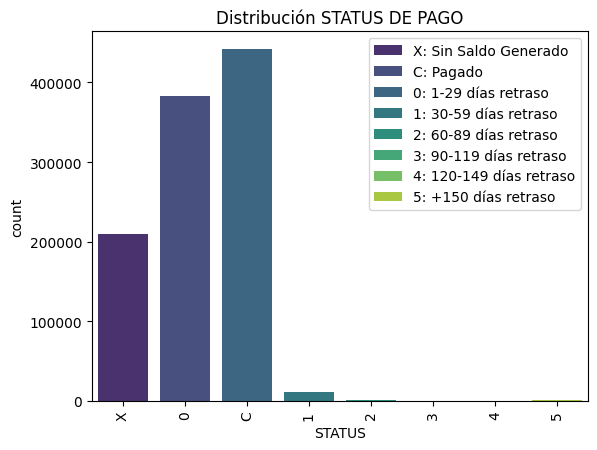

In [22]:
sns.countplot(data = cred_record, x = "STATUS", palette="viridis")
plt.xticks(rotation = 90)
plt.title('Distribución STATUS DE PAGO')
# Agregar leyenda
plt.legend(labels=["X: Sin Saldo Generado", "C: Pagado", "0: 1-29 días retraso",
                    "1: 30-59 días retraso", "2: 60-89 días retraso", "3: 90-119 días retraso",
                    "4: 120-149 días retraso", "5: +150 días retraso"])

In [23]:
# Reclasificamos esta información para establecer quien es considerado un buen cliente o quien 
# presenta un perfil de BAD_DEBTS
cred_record['BAD_DEBTS']=cred_record['STATUS']
cred_record['BAD_DEBTS'] = cred_record['BAD_DEBTS'].replace({'X': 0, 'C': 0})

In [24]:
cred_record.BAD_DEBTS.dtype

dtype('O')

In [25]:
cred_record['BAD_DEBTS']=cred_record['BAD_DEBTS'].astype(int)
cred_record.loc[cred_record['BAD_DEBTS']>=1,'BAD_DEBTS']=1

In [26]:
cred_record.BAD_DEBTS.dtype

dtype('int32')

In [27]:
BAD_DEBTS= cred_record["BAD_DEBTS"].value_counts()
BAD_DEBTS

BAD_DEBTS
0    1034381
1      14194
Name: count, dtype: int64

In [28]:
print(cred_record.nunique())
cred_record["MONTHS_BALANCE"].unique()

ID                45985
MONTHS_BALANCE       61
STATUS                8
BAD_DEBTS             2
dtype: int64


array([  0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9, -10, -11, -12,
       -13, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25,
       -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38,
       -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -51,
       -52, -53, -54, -55, -56, -57, -58, -59, -60], dtype=int64)

In [29]:
cred_record["MONTHS_BALANCE2"]= cred_record["MONTHS_BALANCE"]
cred_record

,ID,MONTHS_BALANCE,STATUS,BAD_DEBTS,MONTHS_BALANCE2
0,5001711,0,X,0,0
1,5001711,-1,0,0,-1
2,5001711,-2,0,0,-2
3,5001711,-3,0,0,-3
4,5001712,0,C,0,0
...,...,...,...,...,...
1048570,5150487,-25,C,0,-25
1048571,5150487,-26,C,0,-26
1048572,5150487,-27,C,0,-27
1048573,5150487,-28,C,0,-28


In [30]:
# El valor de months balance corresponde a todos los meses con estado de cuenta de cada usuario. 
# Por lo tanto, el valor mas pequeño, corresponde a el tiempo en que la cuenta lleva aperturada, o 
# mes de apertura. Por otra parte, el numero mayor, corresponde el ultimo mes de movimiento o
# cancelación de la cuenta. 
# Tambien se creara la variable window, que correspondera a los meses de analisis de los clientes.

CLASIFICACION_CLIENTE= pd.DataFrame(cred_record.groupby(["ID"]).agg({'BAD_DEBTS': 'max',
                                 'MONTHS_BALANCE': 'min', 'MONTHS_BALANCE2': 'max'})).reset_index()
CLASIFICACION_CLIENTE.head()

,ID,BAD_DEBTS,MONTHS_BALANCE,MONTHS_BALANCE2
0,5001711,0,-3,0
1,5001712,0,-18,0
2,5001713,0,-21,0
3,5001714,0,-14,0
4,5001715,0,-59,0


In [31]:
CLASIFICACION_CLIENTE["ACCOUNT_LIFETIME"]= -CLASIFICACION_CLIENTE["MONTHS_BALANCE"] + CLASIFICACION_CLIENTE["MONTHS_BALANCE2"]

In [32]:
CLASIFICACION_CLIENTE.rename(columns={'MONTHS_BALANCE': 'OPEN_MONTH', 'MONTHS_BALANCE2': 'END_MONTH' }, inplace=True)


In [33]:
CLASIFICACION_CLIENTE["OPEN_MONTH"]= -CLASIFICACION_CLIENTE["OPEN_MONTH"]
CLASIFICACION_CLIENTE["END_MONTH"]= -CLASIFICACION_CLIENTE["END_MONTH"]
CLASIFICACION_CLIENTE.tail(3)

,ID,BAD_DEBTS,OPEN_MONTH,END_MONTH,ACCOUNT_LIFETIME
45982,5150484,0,12,0,12
45983,5150485,0,1,0,1
45984,5150487,0,29,0,29


In [34]:
data_eda = pd.merge(apl_record, CLASIFICACION_CLIENTE, how='inner', on=['ID'])

In [35]:
data_eda.shape

(36457, 22)

In [36]:
data_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36457 entries, 0 to 36456
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  object 
 2   FLAG_OWN_CAR         36457 non-null  object 
 3   FLAG_OWN_REALTY      36457 non-null  object 
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  object 
 7   NAME_EDUCATION_TYPE  36457 non-null  object 
 8   NAME_FAMILY_STATUS   36457 non-null  object 
 9   NAME_HOUSING_TYPE    36457 non-null  object 
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null 

In [37]:
data_eda.isnull().sum()

ID                     0
CODE_GENDER            0
FLAG_OWN_CAR           0
FLAG_OWN_REALTY        0
CNT_CHILDREN           0
AMT_INCOME_TOTAL       0
NAME_INCOME_TYPE       0
NAME_EDUCATION_TYPE    0
NAME_FAMILY_STATUS     0
NAME_HOUSING_TYPE      0
DAYS_BIRTH             0
DAYS_EMPLOYED          0
FLAG_MOBIL             0
FLAG_WORK_PHONE        0
FLAG_PHONE             0
FLAG_EMAIL             0
OCCUPATION_TYPE        0
CNT_FAM_MEMBERS        0
BAD_DEBTS              0
OPEN_MONTH             0
END_MONTH              0
ACCOUNT_LIFETIME       0
dtype: int64

In [38]:
# Seleccionar solo las columnas numéricas
numeric_columns = ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'CNT_FAM_MEMBERS', 'ACCOUNT_LIFETIME']

In [39]:
# Seleccionar solo las columas categoricas
categorical_cols = ['CODE_GENDER','FLAG_OWN_CAR','FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
 'FLAG_EMAIL','FLAG_OWN_REALTY','NAME_INCOME_TYPE',"OCCUPATION_TYPE",'NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 
 'NAME_HOUSING_TYPE', 'BAD_DEBTS']

In [40]:
# Seleccionar solo las columas categoricas menos OCCUPATION 
categorical_cols_2= ['CODE_GENDER','FLAG_OWN_CAR','FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
 'FLAG_EMAIL','FLAG_OWN_REALTY','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 
 'NAME_HOUSING_TYPE', 'BAD_DEBTS']

### **Analisis Variables Categoricas**

---

In [41]:
def analisis_categorico(data, lista_variables):
    for column in lista_variables:
        value_counts = data[column].value_counts()
        plt.pie(value_counts, labels=[""] * len(value_counts), autopct='%1.2f%%')
        plt.legend(value_counts.index, loc="upper center", title=column, bbox_to_anchor=(0.5, -0.1))
        plt.title(column)
        plt.show()
        print (value_counts)

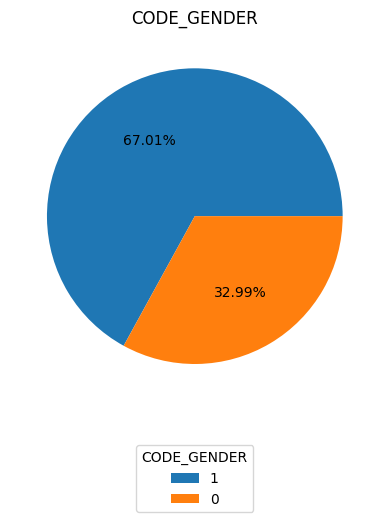

CODE_GENDER
1    24430
0    12027
Name: count, dtype: int64


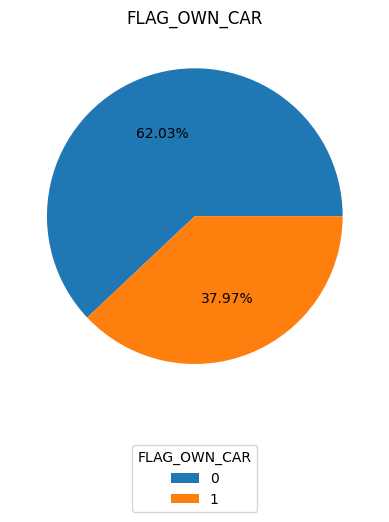

FLAG_OWN_CAR
0    22614
1    13843
Name: count, dtype: int64


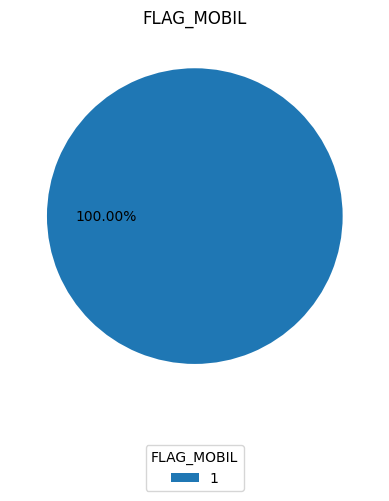

FLAG_MOBIL
1    36457
Name: count, dtype: int64


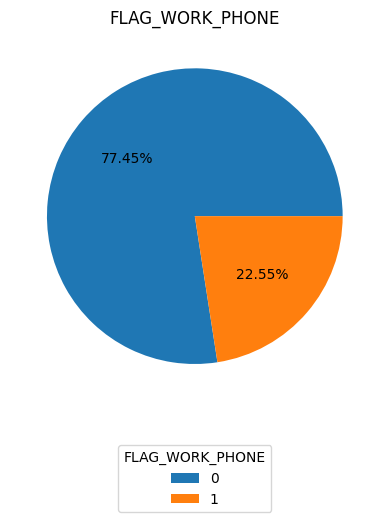

FLAG_WORK_PHONE
0    28235
1     8222
Name: count, dtype: int64


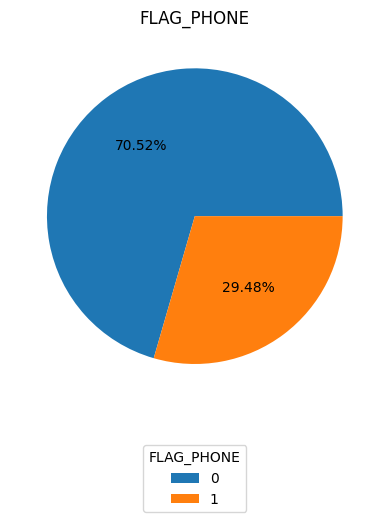

FLAG_PHONE
0    25709
1    10748
Name: count, dtype: int64


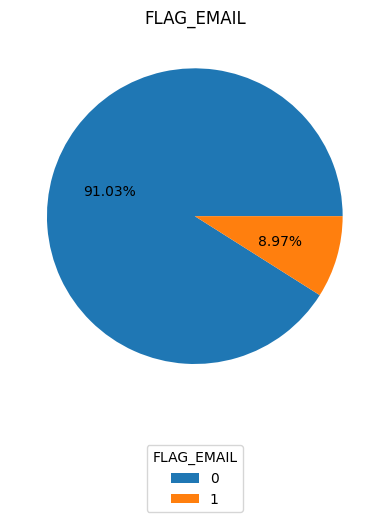

FLAG_EMAIL
0    33186
1     3271
Name: count, dtype: int64


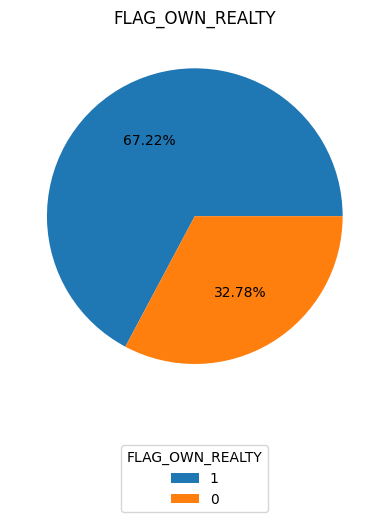

FLAG_OWN_REALTY
1    24506
0    11951
Name: count, dtype: int64


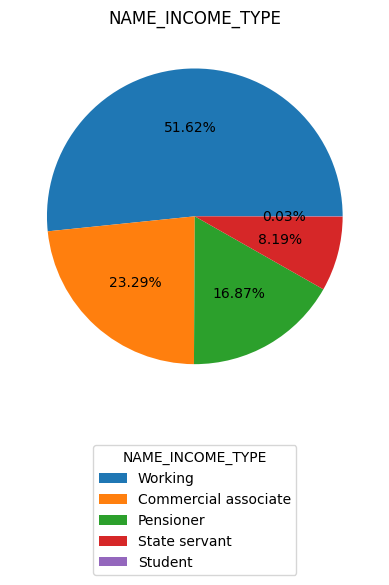

NAME_INCOME_TYPE
Working                 18819
Commercial associate     8490
Pensioner                6152
State servant            2985
Student                    11
Name: count, dtype: int64


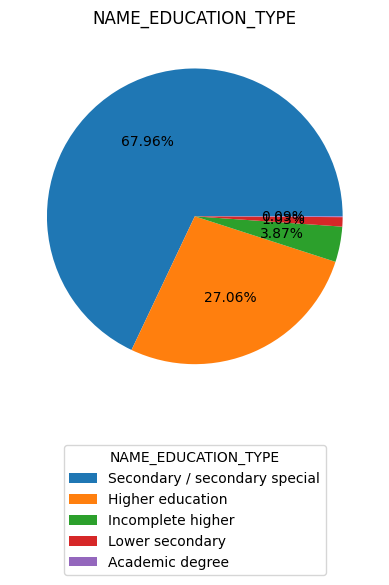

NAME_EDUCATION_TYPE
Secondary / secondary special    24777
Higher education                  9864
Incomplete higher                 1410
Lower secondary                    374
Academic degree                     32
Name: count, dtype: int64


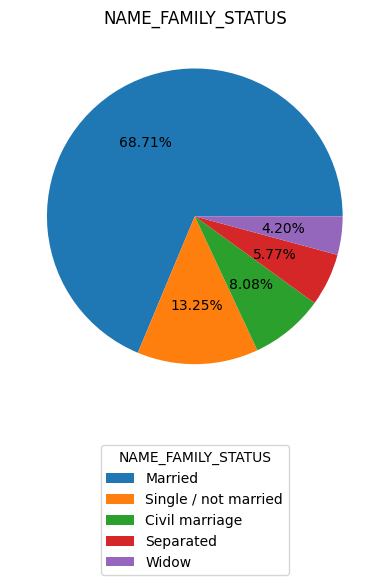

NAME_FAMILY_STATUS
Married                 25048
Single / not married     4829
Civil marriage           2945
Separated                2103
Widow                    1532
Name: count, dtype: int64


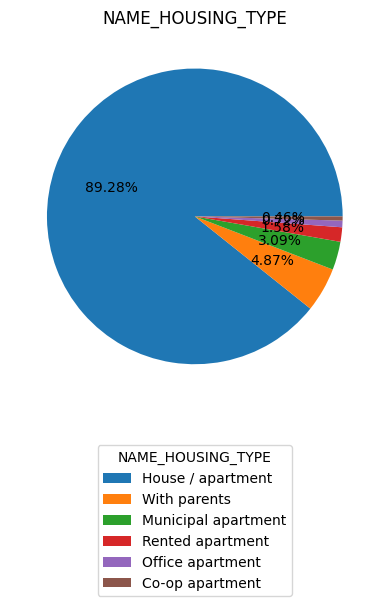

NAME_HOUSING_TYPE
House / apartment      32548
With parents            1776
Municipal apartment     1128
Rented apartment         575
Office apartment         262
Co-op apartment          168
Name: count, dtype: int64


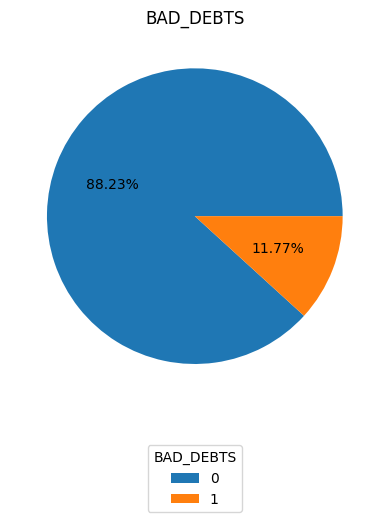

BAD_DEBTS
0    32166
1     4291
Name: count, dtype: int64


In [42]:
analisis_categorico(data_eda, categorical_cols_2)

In [43]:
# Eliminamos la columna debido a que el 100% de la data tiene la misma caracteristica, por lo
# que no es una variable diferenciadora
data_eda.drop(columns="FLAG_MOBIL", inplace=True)

In [44]:
OCCUPATION= data_eda["OCCUPATION_TYPE"].value_counts()


C:\Users\karen\AppData\Local\Temp\ipykernel_18312\98817339.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = data_eda, x = "OCCUPATION_TYPE", palette="viridis",)


Text(0.5, 1.0, 'OCUPACIÓN')

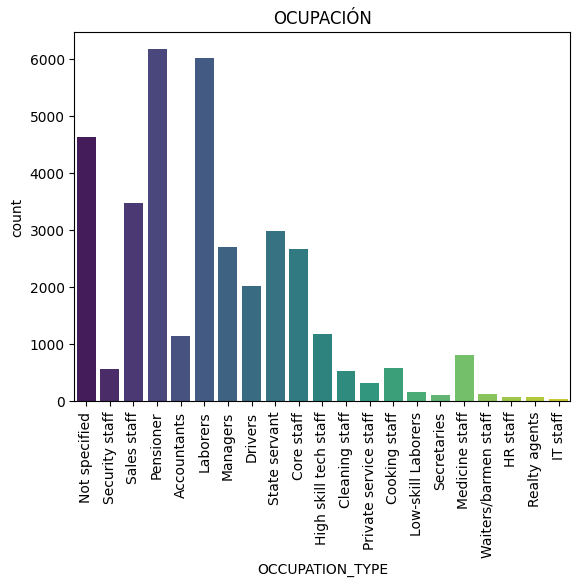

In [45]:
sns.countplot(data = data_eda, x = "OCCUPATION_TYPE", palette="viridis",)
plt.xticks(rotation = 90)
plt.title('OCUPACIÓN')

### **Analisis Variables Numericas**

---

In [46]:
data_eda['AGE_YEARS']=round(-data_eda['DAYS_BIRTH']/365,0)

data_eda.drop(columns=["DAYS_BIRTH"],inplace=True)


Text(0.5, 1.0, 'Boxplot AGE_YEARS')

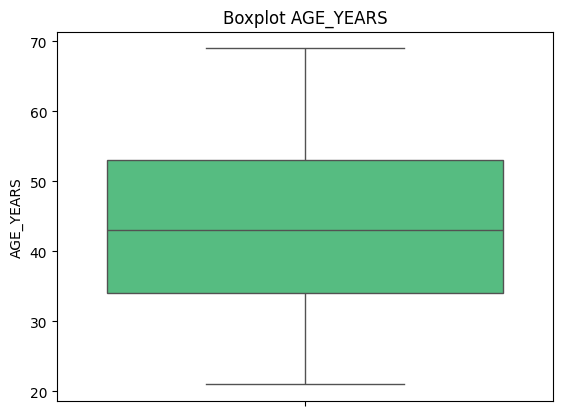

In [47]:
sns.boxplot(data=data_eda, y=data_eda['AGE_YEARS'], color= "#45CD7E");
plt.title('Boxplot AGE_YEARS')

Text(0.5, 1.0, 'Histplot AGE_YEARS')

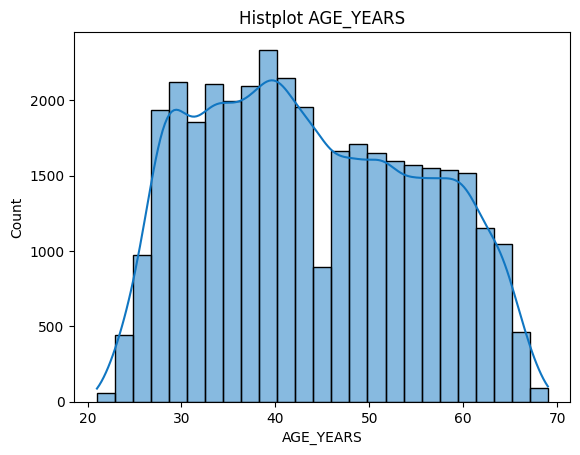

In [48]:
sns.histplot(data_eda["AGE_YEARS"], kde=True, bins=25, color="#1076C2")
plt.title('Histplot AGE_YEARS')

In [49]:
data_eda["CNT_CHILDREN"].value_counts().sort_values()

CNT_CHILDREN
19        1
7         2
14        3
5        20
4        63
3       419
2      3256
1      7492
0     25201
Name: count, dtype: int64

Text(0.5, 1.0, 'Boxplot CNT_CHILDREN')

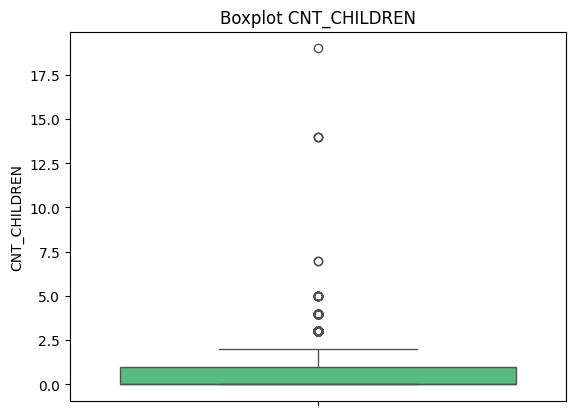

In [50]:
sns.boxplot(data=data_eda, y=data_eda['CNT_CHILDREN'], color= "#45CD7E")
plt.title('Boxplot CNT_CHILDREN')

In [51]:
data_eda[["ID","DAYS_EMPLOYED","OCCUPATION_TYPE", "AMT_INCOME_TOTAL","CODE_GENDER",
            "AGE_YEARS", "CNT_CHILDREN"]][data_eda["CNT_CHILDREN"]>7].head()
# Parece que se encuentran repeditos algunos usuarios, no se eliminaran debido al poco porcentaje 
# que representan. Sin embargo, si se trataran los outlaiers mas altos 

,ID,DAYS_EMPLOYED,OCCUPATION_TYPE,AMT_INCOME_TOTAL,CODE_GENDER,AGE_YEARS,CNT_CHILDREN
14671,5061207,-1689,Drivers,225000.0,0,49.0,14
14672,5061210,-1689,Drivers,225000.0,0,49.0,14
14673,5061211,-1689,Drivers,225000.0,0,49.0,14
25412,5105054,-1853,Waiters/barmen staff,112500.0,1,30.0,19


In [52]:
#Revisamos nuevamente los casos de los ID con CNT_CHILDREN> 7 
print("Cantidad outliers: ", len(data_eda[data_eda["CNT_CHILDREN"]>7]))

print("Edad promedio: ", data_eda[data_eda["CNT_CHILDREN"]>7]["AGE_YEARS"].mean())
print("Mediana de CNT_CHILDREN: ", data_eda["CNT_CHILDREN"].median())

Cantidad outliers:  4
Edad promedio:  44.25
Mediana de CNT_CHILDREN:  0.0


Text(0.5, 1.0, 'Boxplot CNT_CHILDREN')

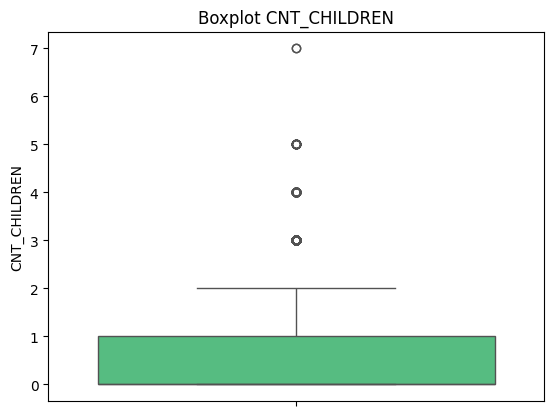

In [53]:
# Considerando que la media y la mediana de CANT_CHILDREN es 0, deducimos que los outliers son
# errores aleatorios al ingresar los datos, por lo cual reemplazaremos los valores mayores de 7 con 0
# Sin embargo, para efectos mas practicos, se podrian dejar como outliers, debido al poco % que
# representan sobre el total de la data.

data_eda.loc[data_eda["CNT_CHILDREN"]>7, "CNT_CHILDREN"]= 0
sns.boxplot(data=data_eda, y=data_eda['CNT_CHILDREN'], color= "#45CD7E")
plt.title('Boxplot CNT_CHILDREN')

Text(0.5, 1.0, 'Histplot CNT_CHILDREN')

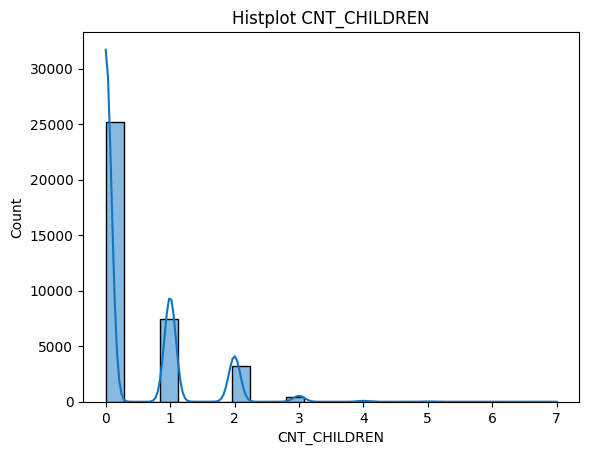

In [54]:
sns.histplot(data_eda["CNT_CHILDREN"], kde=True, bins=25, color="#1076C2")
plt.title('Histplot CNT_CHILDREN')

In [55]:
data_eda["CNT_FAM_MEMBERS"].value_counts()
# Los outliers se mantienen debido a la poca cantidad que representan.

CNT_FAM_MEMBERS
2.0     19463
1.0      6987
3.0      6421
4.0      3106
5.0       397
6.0        58
7.0        19
15.0        3
9.0         2
20.0        1
Name: count, dtype: int64

In [56]:
# Se recalcula la variable DAYS_EMPLOYED, creando una nueva columna para los valores <0 llamada 
# YEARS_EMPLOYED y una columna para los valores >0 llamada YEARS_UNEMPLOYED

data_eda.loc[data_eda["DAYS_EMPLOYED"]<=0 , "YEARS_EMPLOYED"]= round(-data_eda['DAYS_EMPLOYED']/365, ndigits=2)
data_eda.loc[data_eda["DAYS_EMPLOYED"]>0, "YEARS_UNEMPLOYED"]= round(data_eda['DAYS_EMPLOYED']/365, ndigits=2)

data_eda.loc[data_eda["YEARS_EMPLOYED"].isnull() , "YEARS_EMPLOYED"]= 0
data_eda.loc[data_eda["YEARS_UNEMPLOYED"].isnull(), "YEARS_UNEMPLOYED"]= 0
data_eda["YEARS_UNEMPLOYED"].value_counts()


YEARS_UNEMPLOYED
0.00       30322
1000.67     6135
Name: count, dtype: int64

Text(0.5, 1.0, 'Histplot YEARS_UNEMPLOYED')

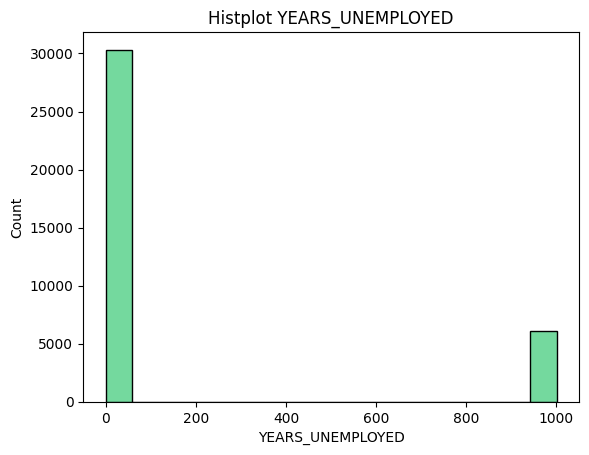

In [57]:
sns.histplot(data=data_eda, x=data_eda['YEARS_UNEMPLOYED'], color= "#45CD7E")
plt.title('Histplot YEARS_UNEMPLOYED')

In [58]:
# Se observan un valor unico no valido dentro de la columna YEARS_UNEMPLOYED, se procede a eliminar
# este valor erroreo. Al quedar la columna vacia se procede a elimarla, al igual que DAYS_EMPLOYED
data_eda.loc[data_eda["YEARS_UNEMPLOYED"]== 1000.67, "YEARS_UNEMPLOYED"]= 0
data_eda.drop(columns="DAYS_EMPLOYED", inplace=True)
data_eda.drop(columns="YEARS_UNEMPLOYED", inplace=True)

Text(0.5, 1.0, 'Boxplot YEARS_EMPLOYED')

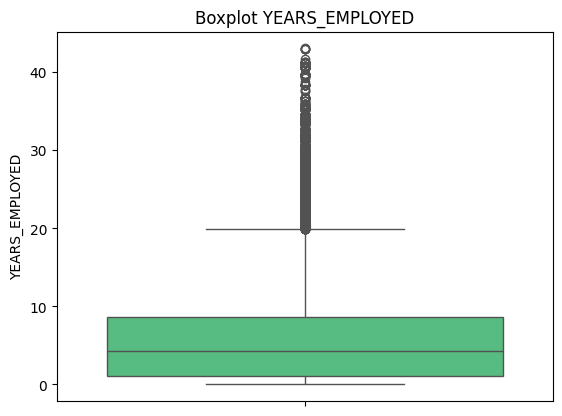

In [59]:
sns.boxplot(data=data_eda, y=data_eda['YEARS_EMPLOYED'], color= "#45CD7E")
plt.title('Boxplot YEARS_EMPLOYED')


In [60]:
print (len(data_eda[data_eda["YEARS_EMPLOYED"]>20]))

1741


In [61]:
data_eda["AGE_YEARS"].max()

69.0

In [62]:
data_eda.loc[(data_eda["YEARS_EMPLOYED"] > 40) & (data_eda["AGE_YEARS"] < 60), "YEARS_EMPLOYED"] = data_eda["YEARS_EMPLOYED"].median()
print (len(data_eda[data_eda["YEARS_EMPLOYED"]>20]))

1738


Text(0.5, 1.0, 'Boxplot YEARS_EMPLOYED')

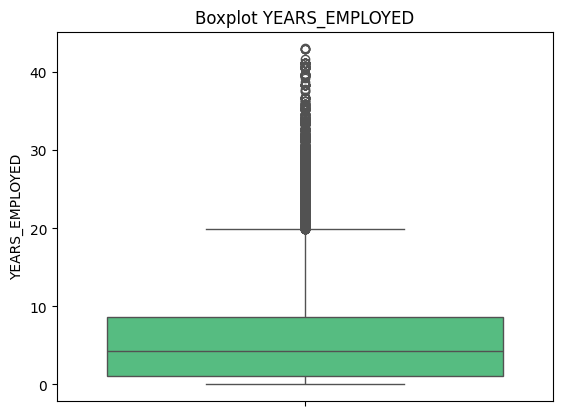

In [63]:
sns.boxplot(data=data_eda, y=data_eda['YEARS_EMPLOYED'], color= "#45CD7E")
plt.title('Boxplot YEARS_EMPLOYED')

Text(0.5, 1.0, 'HISTPLOT YEARS EMPLOYED')

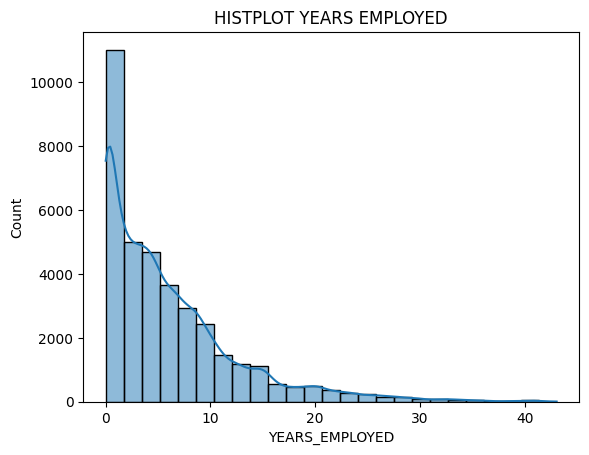

In [64]:
sns.histplot(data_eda["YEARS_EMPLOYED"], bins=25, kde=True)
plt.title('HISTPLOT YEARS EMPLOYED')

In [65]:
data_eda[["AMT_INCOME_TOTAL"]]

,AMT_INCOME_TOTAL
0,427500.0
1,427500.0
2,112500.0
3,270000.0
4,270000.0
...,...
36452,315000.0
36453,157500.0
36454,157500.0
36455,283500.0


Text(0.5, 1.0, 'BOXPLOT INCOME_TOTAL')

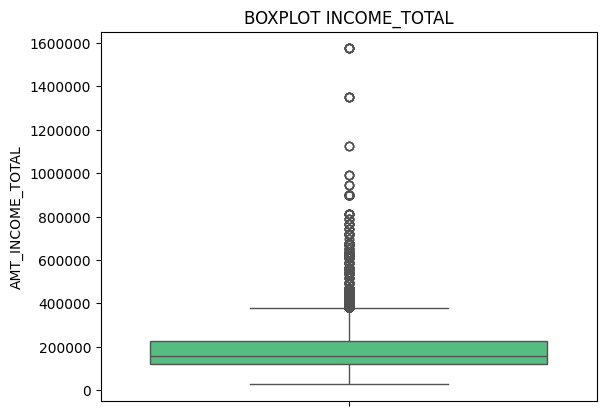

In [66]:
sns.boxplot(data=data_eda, y='AMT_INCOME_TOTAL', color= "#45CD7E")
plt.ticklabel_format(style='plain', axis='y')
plt.title('BOXPLOT INCOME_TOTAL')

In [67]:
income= data_eda["AMT_INCOME_TOTAL"]>1000000
income.value_counts()


AMT_INCOME_TOTAL
False    36440
True        17
Name: count, dtype: int64

In [68]:
porcentaje= (17/(36440+17))*100
porcentaje 
#0.04% de outliers 

0.04663027676440738

In [69]:
data_eda[["ID","AMT_INCOME_TOTAL"]][data_eda["AMT_INCOME_TOTAL"]>1000000]

,ID,AMT_INCOME_TOTAL
705,5009694,1350000.0
706,5009695,1350000.0
707,5009698,1350000.0
708,5009699,1350000.0
709,5009700,1350000.0
710,5090752,1350000.0
5041,5025201,1125000.0
21584,5090777,1125000.0
26646,5112948,1125000.0
33985,5143231,1575000.0


Text(0.5, 1.0, 'HISTPLOT INCOME TOTAL <1,000,000 (99.9%)')

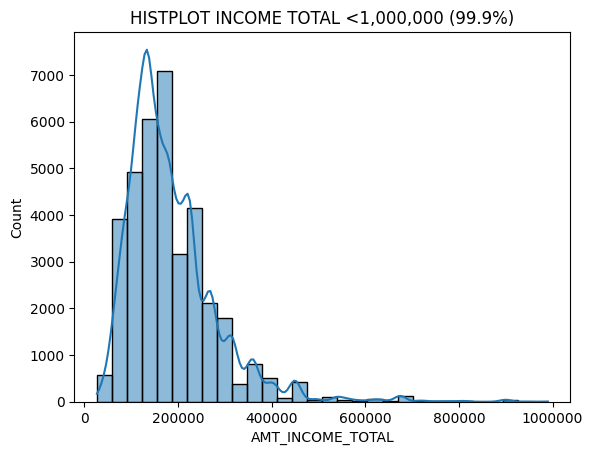

In [70]:
MENOR_1M= data_eda[data_eda["AMT_INCOME_TOTAL"]<1000000]
sns.histplot(MENOR_1M["AMT_INCOME_TOTAL"], kde=True, bins=30)
plt.ticklabel_format(style='plain', axis='y')  # Establecer estilo de las etiquetas en "plain" para el eje y
plt.ticklabel_format(style='plain', axis='x')  # Establecer estilo de las etiquetas en "plain" para el eje x
plt.title('HISTPLOT INCOME TOTAL <1,000,000 (99.9%)')

### **Analisis de Correlaciones**

---

In [71]:
data_eda.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,BAD_DEBTS,OPEN_MONTH,END_MONTH,ACCOUNT_LIFETIME,AGE_YEARS,YEARS_EMPLOYED
0,5008804,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Not specified,2.0,1,15,0,15,33.0,12.44
1,5008805,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Not specified,2.0,1,14,0,14,33.0,12.44
2,5008806,0,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,0,0,Security staff,2.0,0,29,0,29,59.0,3.11
3,5008808,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1.0,0,4,0,4,52.0,8.36
4,5008809,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1.0,0,26,22,4,52.0,8.36


In [72]:
data_eda.dtypes

ID                       int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN             int64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS        float64
BAD_DEBTS                int32
OPEN_MONTH               int64
END_MONTH                int64
ACCOUNT_LIFETIME         int64
AGE_YEARS              float64
YEARS_EMPLOYED         float64
dtype: object

In [73]:
# Seleccionar solo las columnas numéricas
numeric_columns = data_eda.select_dtypes(include=['float64', 'int64', "int32", "float64"])
numeric_columns.columns

Index(['ID', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'FLAG_WORK_PHONE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'BAD_DEBTS',
       'OPEN_MONTH', 'END_MONTH', 'ACCOUNT_LIFETIME', 'AGE_YEARS',
       'YEARS_EMPLOYED'],
      dtype='object')

In [74]:
(data_eda["BAD_DEBTS"]).value_counts()


BAD_DEBTS
0    32166
1     4291
Name: count, dtype: int64

C:\Users\karen\AppData\Local\Temp\ipykernel_18312\86214996.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_eda, x= "BAD_DEBTS", palette="viridis")


Text(0.5, 1.0, 'COUNT_PLOT BAD_DEBTS')

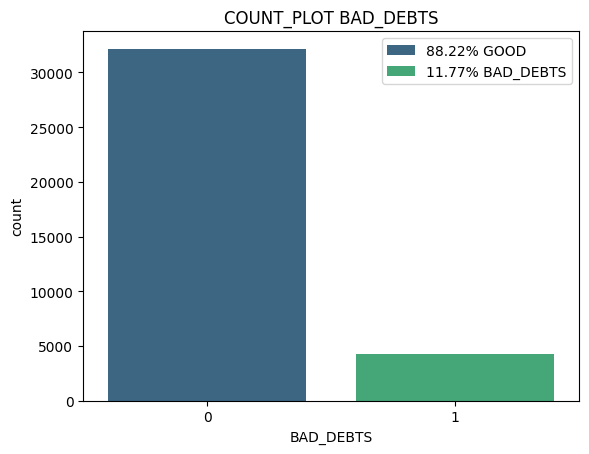

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=data_eda, x= "BAD_DEBTS", palette="viridis")
plt.legend(["88.22% GOOD","11.77% BAD_DEBTS"])
plt.title('COUNT_PLOT BAD_DEBTS')


In [76]:
clasification= data_eda["BAD_DEBTS"].value_counts()
percentaje= clasification[1]/(clasification[0]+clasification[1])*100
print(100-percentaje)
percentaje

88.22996955317223


11.77003044682777

In [77]:
# numeric_columns.drop(columns= "FLAG_MOBIL", inplace=True)

<Axes: >

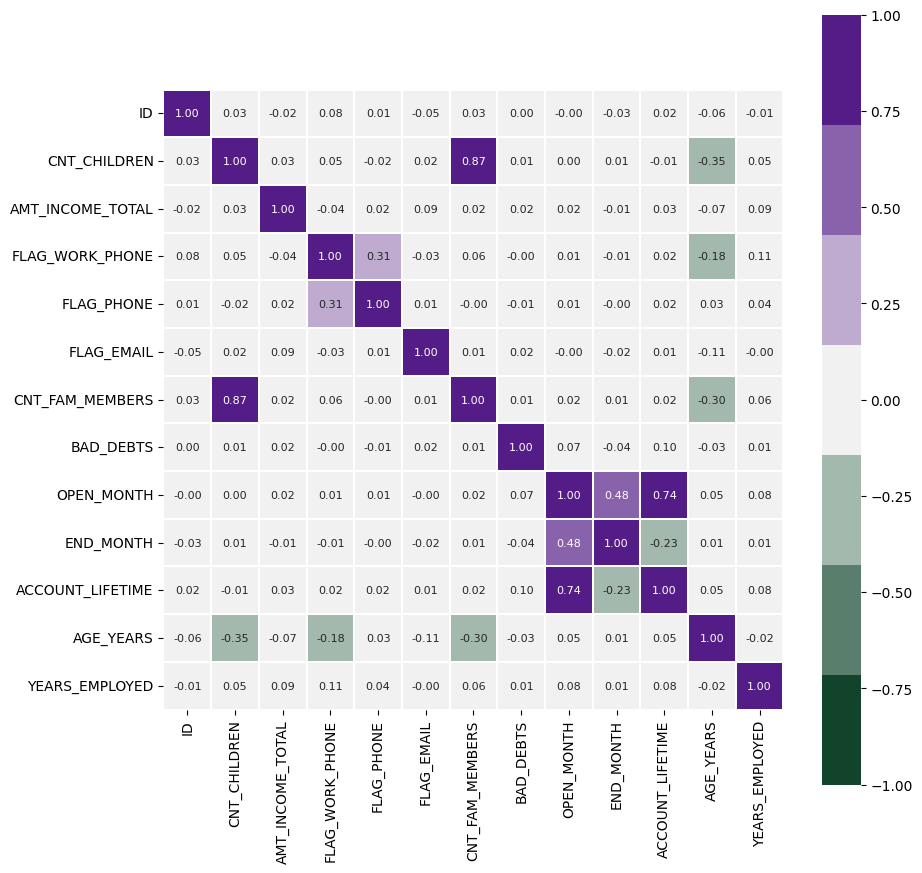

In [78]:
plt.figure(figsize=(10,10))
sns.heatmap(numeric_columns.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True,
            fmt='.2f',  # Establecer el formato de las cifras decimales a dos decimales
            annot_kws={"size": 8})  # Establecer el tamaño de las letras a 8 puntos);

<Axes: xlabel='CODE_GENDER', ylabel='AMT_INCOME_TOTAL'>

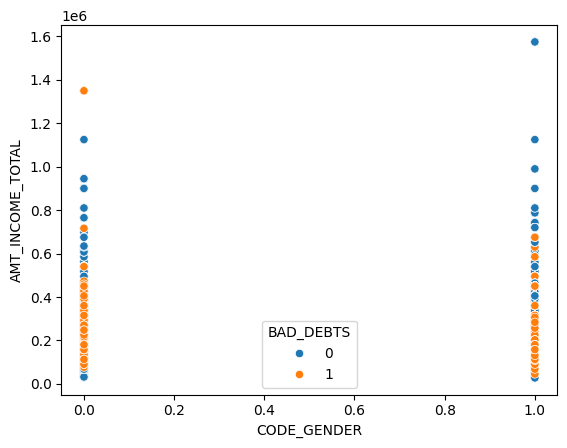

In [79]:
sns.scatterplot(data=data_eda ,x= "CODE_GENDER", y="AMT_INCOME_TOTAL", hue="BAD_DEBTS")

In [80]:
categorical_cols = data_eda.select_dtypes(include=['object']).columns.tolist()
categorical_cols

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE']

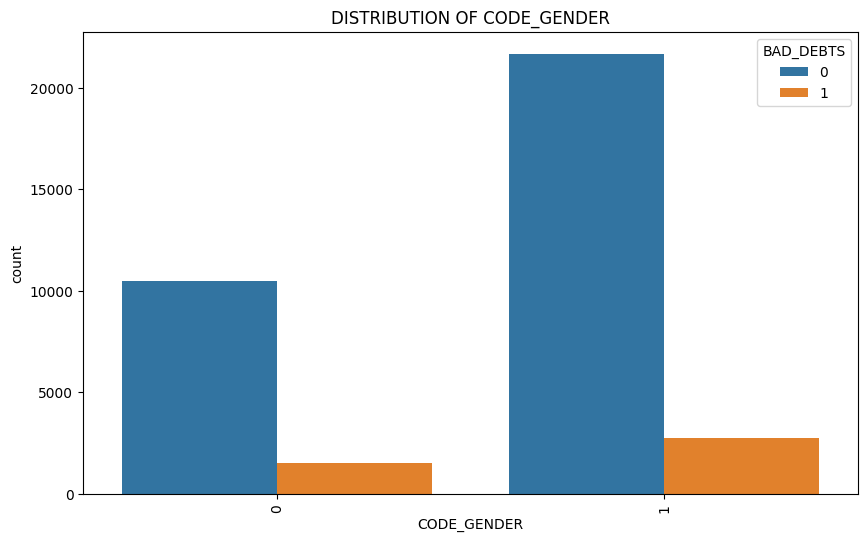

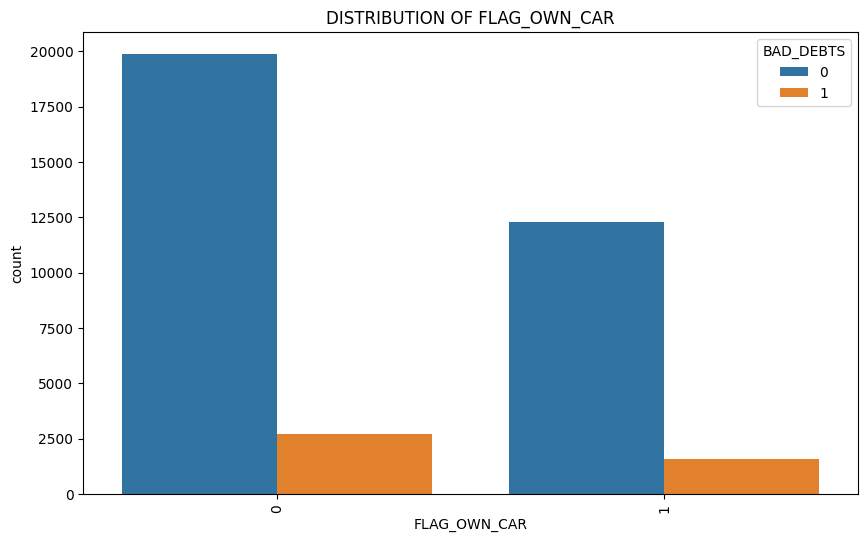

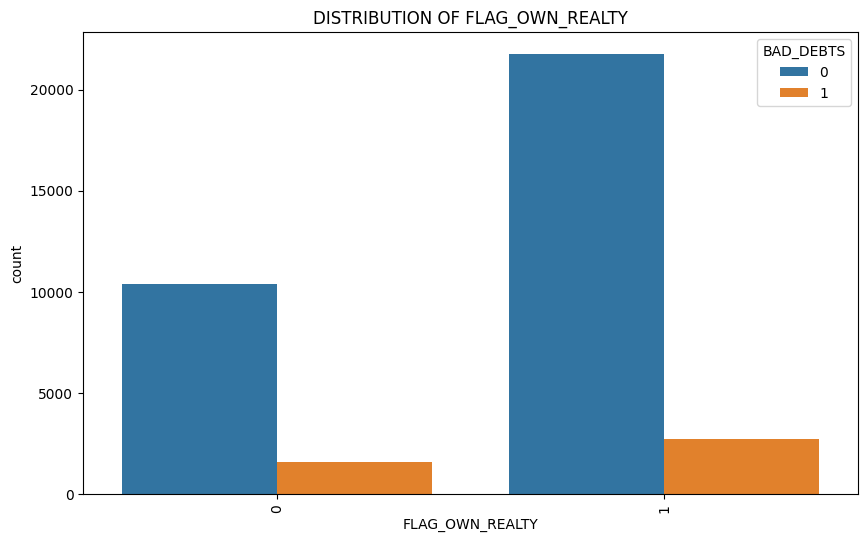

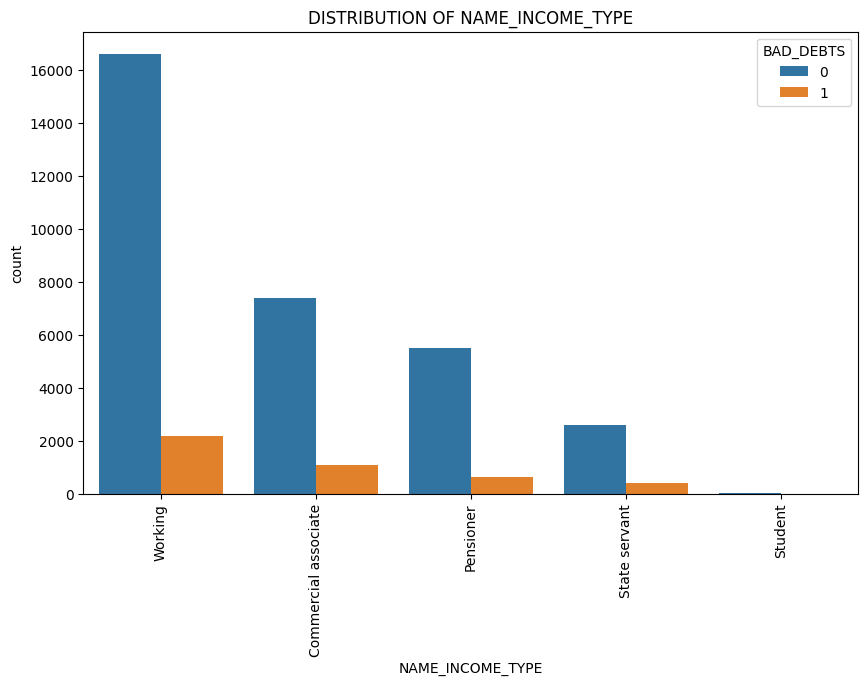

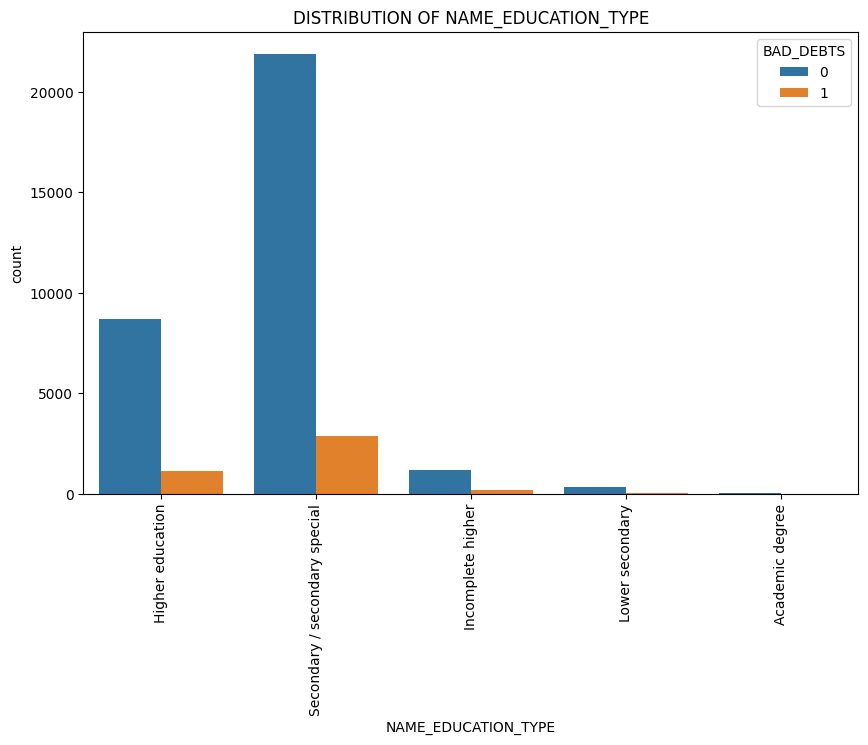

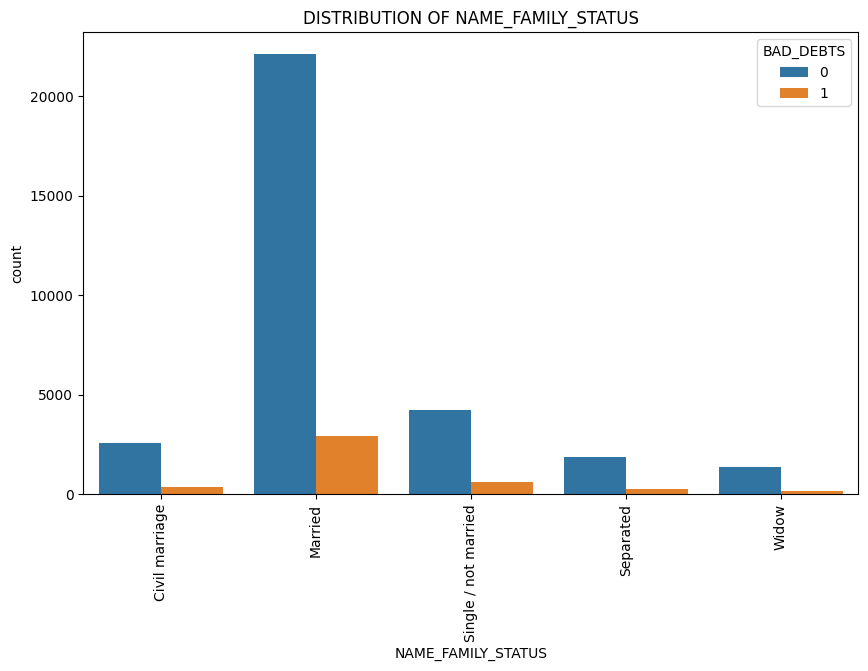

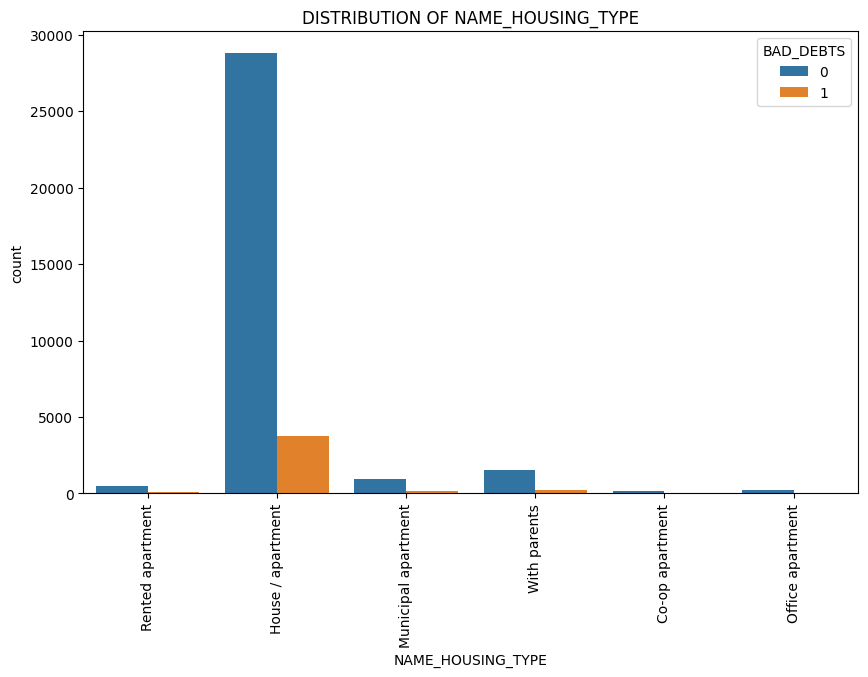

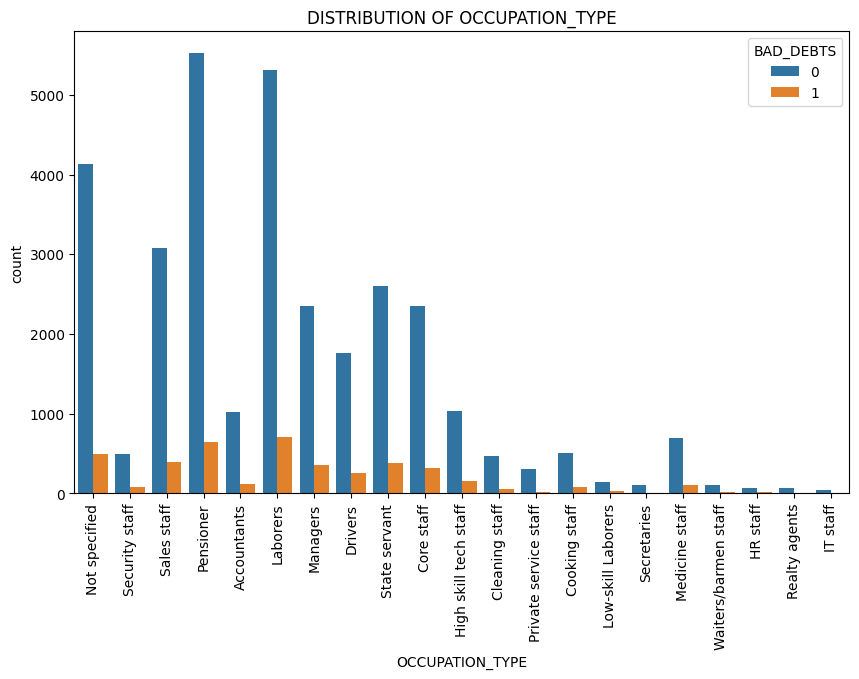

In [81]:
for col in categorical_cols:
  plt.figure(figsize=(10,6))
  sns.countplot(data=data_eda,x=col,hue='BAD_DEBTS')
  plt.title(f'DISTRIBUTION OF {col}')
  plt.xticks(rotation=90)
  plt.show()
  print("\n")

In [82]:
data_eda.columns

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_WORK_PHONE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'BAD_DEBTS', 'OPEN_MONTH', 'END_MONTH', 'ACCOUNT_LIFETIME', 'AGE_YEARS',
       'YEARS_EMPLOYED'],
      dtype='object')

In [83]:
set_2= data_eda[['CNT_CHILDREN','AMT_INCOME_TOTAL', 'CNT_FAM_MEMBERS',
       'BAD_DEBTS', 'OPEN_MONTH', 'END_MONTH', 'ACCOUNT_LIFETIME', 'AGE_YEARS',
       'YEARS_EMPLOYED']]

### Visualización pairplot y DecisionTreeClassifier

---

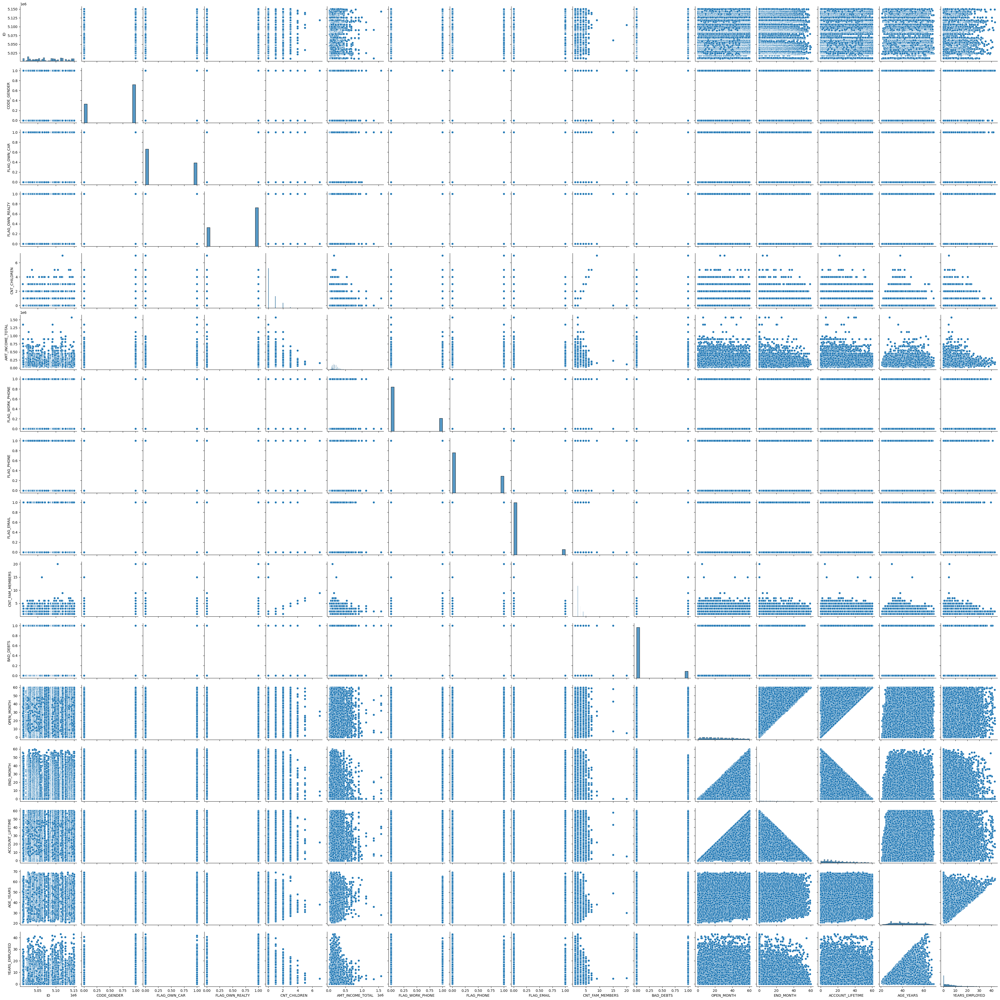

In [84]:
sns.pairplot(data=data_eda)

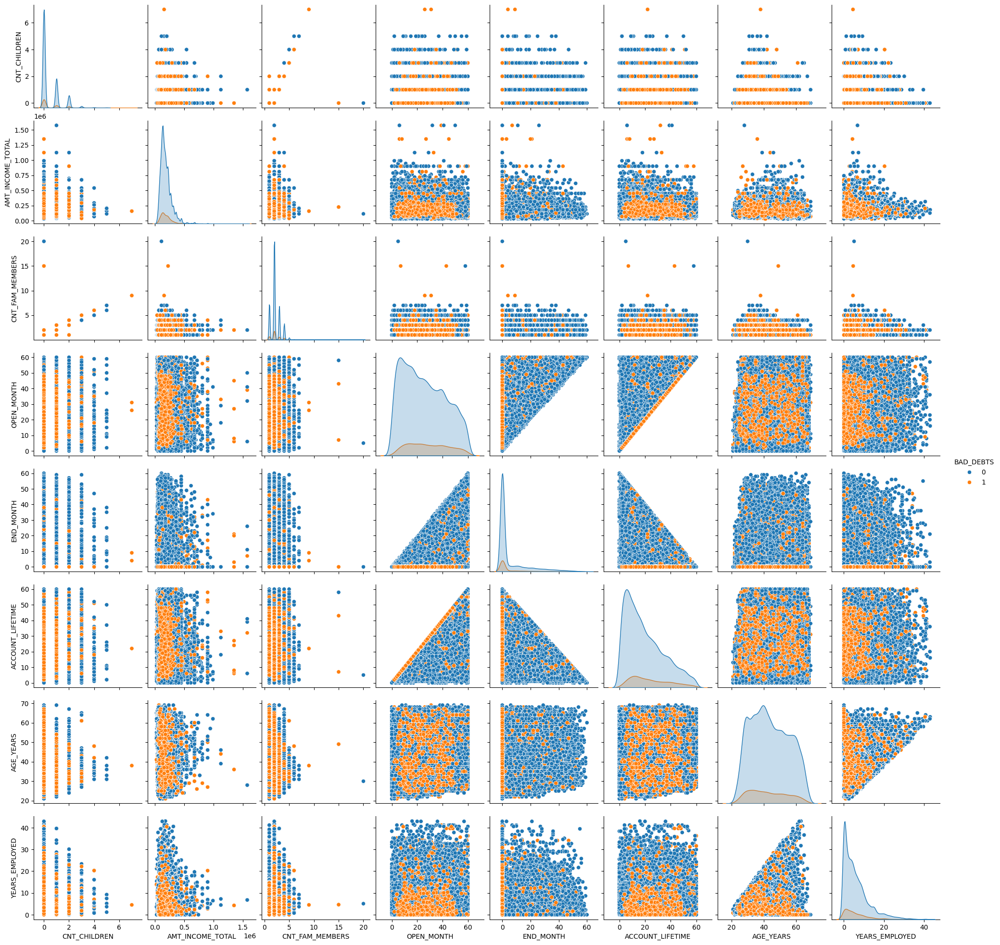

In [85]:
sns.pairplot(data=set_2, hue="BAD_DEBTS")

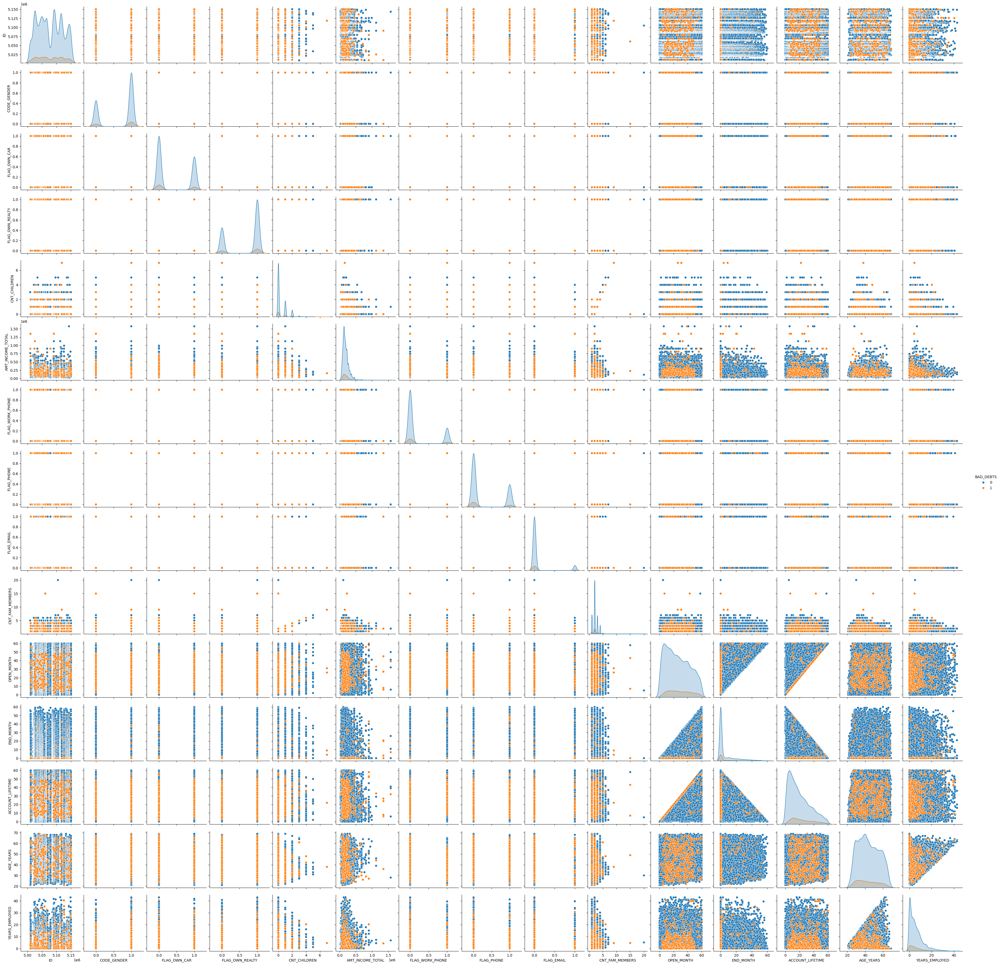

In [86]:
sns.pairplot(data=data_eda, hue="BAD_DEBTS")

In [87]:
from sklearn.tree import DecisionTreeClassifier

In [88]:
data_eda.head(5)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,BAD_DEBTS,OPEN_MONTH,END_MONTH,ACCOUNT_LIFETIME,AGE_YEARS,YEARS_EMPLOYED
0,5008804,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Not specified,2.0,1,15,0,15,33.0,12.44
1,5008805,0,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,0,0,Not specified,2.0,1,14,0,14,33.0,12.44
2,5008806,0,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,0,0,Security staff,2.0,0,29,0,29,59.0,3.11
3,5008808,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1.0,0,4,0,4,52.0,8.36
4,5008809,1,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,1,Sales staff,1.0,0,26,22,4,52.0,8.36


In [89]:

# Codificar las características categóricas utilizando one-hot encoding
data_encoded = pd.get_dummies(data_eda)

# Definir y separar las características y la variable objetivo
y = data_encoded["BAD_DEBTS"]
x = data_encoded.drop(columns=["BAD_DEBTS"])

# Dividir los datos en conjuntos de entrenamiento y prueba- NO HACE FALTA DICE DAVID
#x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


# Definir el modelo de árbol de decisión
tree_regr = DecisionTreeClassifier(max_depth=5, random_state=42)
tree_regr.fit(x,y)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [90]:
correlaciones= pd.DataFrame(tree_regr.feature_importances_)

In [91]:
columns= pd.DataFrame(x.columns)

In [98]:
resultado= pd.concat([correlaciones, columns], keys=["Correlacion", "Variable"], ignore_index=True, axis=1)
resultado.rename(columns={0:"Importancia", 1:"Variable"}, inplace=True)
resultado.sort_values(by="Importancia", ascending=False).head(10)


,Importancia,Variable
9,0.554074,ACCOUNT_LIFETIME
10,0.084825,AGE_YEARS
0,0.069728,ID
11,0.047895,YEARS_EMPLOYED
28,0.047838,NAME_FAMILY_STATUS_Civil marriage
2,0.042792,AMT_INCOME_TOTAL
26,0.042278,NAME_EDUCATION_TYPE_Lower secondary
6,0.021325,CNT_FAM_MEMBERS
14,0.020638,FLAG_OWN_CAR_0
35,0.020061,NAME_HOUSING_TYPE_Municipal apartment


### Análisis de cosechas

---

Después de analizar los resultados de la correlación entre las variables, se emplea el método de Moras Vintage o Análisis de cosechas para buscar una tendencia sobre el riesgo de una cartera, utilizando como parámetro la cantidad de meses de vida de la cuenta.

In [ ]:
# El analisis se realizara sobre la base de datos credit_record.csv
grouped = credit.groupby('ID')

# SE CONSTRUYE UNA TABLA DONDE EL ID SON LAS FILAS y LOS VALORES MONTHS_BALANCE SON COLUMNAS
# De esta forma podemos analizar la cantidad de incidencias de malas cuentas por mes
pivot_tb = credit.pivot(index = 'ID', columns = 'MONTHS_BALANCE', values = 'STATUS')


In [ ]:
pivot_tb.head(5)

MONTHS_BALANCE,-60,-59,-58,-57,-56,-55,-54,-53,-52,-51,...,-9,-8,-7,-6,-5,-4,-3,-2,-1,0
ID,,,,,,,,,,,,,,,,,,,,,
5001711,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,X
5001712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,C,C,C,C,C,C,C,C,C
5001713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,X,X
5001714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,X,X
5001715,NaN,X,X,X,X,X,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X


In [ ]:
# Calculamos la fecha de apertura de la cuenta. El valor mas pequeño (porque estan negativos)
pivot_tb['open_month'] = grouped['MONTHS_BALANCE'].min() 
# El mayor valor es es el ultimo mes  observado o fecha de cancelación
pivot_tb['end_month'] = grouped['MONTHS_BALANCE'].max() 
pivot_tb

MONTHS_BALANCE,-60,-59,-58,-57,-56,-55,-54,-53,-52,-51,...,-7,-6,-5,-4,-3,-2,-1,0,open_month,end_month
ID,,,,,,,,,,,,,,,,,,,,,
5001711,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,X,-3,0
5001712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,C,C,C,C,C,C,C,C,-18,0
5001713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,-21,0
5001714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,-14,0
5001715,NaN,X,X,X,X,X,X,X,X,X,...,X,X,X,X,X,X,X,X,-59,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5150482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-28,-11
5150483,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,-17,0
5150484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,C,-12,0


In [ ]:
#Establecemos el tiempo de observación de las cuentas. Cuantos mes ha generado información.
pivot_tb['ID'] = pivot_tb.index
pivot_tb = pivot_tb[['ID', 'open_month', 'end_month']]
pivot_tb['window'] = pivot_tb['end_month'] - pivot_tb['open_month'] # tiempo de observacion 
pivot_tb.reset_index(drop = True, inplace = True)
pivot_tb.head()

C:\Users\karen\AppData\Local\Temp\ipykernel_15872\835503452.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_tb['window'] = pivot_tb['end_month'] - pivot_tb['open_month'] # tiempo de observacion


MONTHS_BALANCE,ID,open_month,end_month,window
0,5001711,-3,0,3
1,5001712,-18,0,18
2,5001713,-21,0,21
3,5001714,-14,0,14
4,5001715,-59,0,59


In [ ]:
#Se unifica la informacion en una tabla
credit = pd.merge(credit, pivot_tb, on = 'ID', how = 'left') 
credit.head()


,ID,MONTHS_BALANCE,STATUS,BAD_DEBTS,MONTHS_BALANCE2,open_month,end_month,window
0,5001711,0,X,0,0,-3,0,3
1,5001711,-1,0,0,-1,-3,0,3
2,5001711,-2,0,0,-2,-3,0,3
3,5001711,-3,0,0,-3,-3,0,3
4,5001712,0,C,0,0,-18,0,18


In [ ]:

credit0 = credit.copy()
#Decodificamos los estatus
credit['status'] = np.where((credit['STATUS'] == '2') | (credit['STATUS'] == '3' )| (credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 1, 0) # analyze > 60 days past due 
credit['status'] = credit['status'].astype(np.int8) # 1: Mora o BAD_DEBT,  0: Buen cliente
credit['month_on_book'] = credit['MONTHS_BALANCE'] - credit['open_month'] # calculate month on book: how many months after opening account
credit.sort_values(by = ['ID','month_on_book'], inplace = True)
credit.head()


,ID,MONTHS_BALANCE,STATUS,BAD_DEBTS,MONTHS_BALANCE2,open_month,end_month,window,status,month_on_book
3,5001711,-3,0,0,-3,-3,0,3,0,0
2,5001711,-2,0,0,-2,-3,0,3,0,1
1,5001711,-1,0,0,-1,-3,0,3,0,2
0,5001711,0,X,0,0,-3,0,3,0,3
22,5001712,-18,0,0,-18,-18,0,18,0,0


In [ ]:
# Denominator para el calculo de ratios
denominator = pivot_tb.groupby(['open_month']).agg({'ID': ['count']}) # Cuenta cuantos usuarios abren cuenta mencualmente.
denominator.reset_index(inplace = True)
denominator.columns = ['open_month','sta_sum']
denominator.head()

,open_month,sta_sum
0,-60,415
1,-59,406
2,-58,440
3,-57,400
4,-56,470


In [ ]:
# Vintage table
vintage = credit.groupby(['open_month','month_on_book']).agg({'ID': ['count']}) 
vintage.reset_index(inplace = True)
vintage.columns = ['open_month','month_on_book','sta_sum'] 
#Cuentas que estan en impago. 
vintage['due_count'] = np.nan
vintage = vintage[['open_month','month_on_book','due_count']] # delete aggerate column
vintage = pd.merge(vintage, denominator, on = ['open_month'], how = 'left') # join sta_sum colun to vintage table
vintage

,open_month,month_on_book,due_count,sta_sum
0,-60,0,NaN,415
1,-60,1,NaN,415
2,-60,2,NaN,415
3,-60,3,NaN,415
4,-60,4,NaN,415
...,...,...,...,...
1886,-2,1,NaN,771
1887,-2,2,NaN,771
1888,-1,0,NaN,686
1889,-1,1,NaN,686


In [ ]:
for j in range(-60,1): # Loop externo: cuando las cuentas fueron abiertas 
    ls = []
    for i in range(0,61): # Tiempo despues de que la cuenta fuera abierta
        due = list(credit[(credit['status'] == 1) & (credit['month_on_book'] == i) & (credit['open_month'] == j)]['ID']) # get ID which satisfy the condition
        ls.extend(due) # Va sumando malos clientes
        vintage.loc[(vintage['month_on_book'] == i) & (vintage['open_month'] == j), 'due_count'] = len(set(ls)) # calculate non-duplicate ID numbers using set()
        
vintage['sta_rate']  = vintage['due_count'] / vintage['sta_sum'] # calculate cumulative % of bad customers
vintage  

,open_month,month_on_book,due_count,sta_sum,sta_rate
0,-60,0,0.0,415,0.000000
1,-60,1,0.0,415,0.000000
2,-60,2,0.0,415,0.000000
3,-60,3,0.0,415,0.000000
4,-60,4,0.0,415,0.000000
...,...,...,...,...,...
1886,-2,1,0.0,771,0.000000
1887,-2,2,1.0,771,0.001297
1888,-1,0,0.0,686,0.000000
1889,-1,1,0.0,686,0.000000


In [ ]:
# Vintage wide tabla
vintage_wide = vintage.pivot(index = 'open_month',
                             columns = 'month_on_book',
                             values = 'sta_rate')
vintage_wide

month_on_book,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
open_month,,,,,,,,,,,,,,,,,,,,,
-60,0.0,0.0,0.000000,0.000000,0.000000,0.002410,0.002410,0.007229,0.007229,0.009639,...,0.028916,0.028916,0.028916,0.028916,0.028916,0.028916,0.028916,0.031325,0.031325,0.031325
-59,0.0,0.0,0.000000,0.004926,0.004926,0.004926,0.007389,0.007389,0.007389,0.012315,...,0.029557,0.029557,0.029557,0.032020,0.032020,0.032020,0.032020,0.032020,0.032020,NaN
-58,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.004545,0.006818,0.006818,...,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,NaN,NaN
-57,0.0,0.0,0.000000,0.000000,0.002500,0.002500,0.002500,0.007500,0.007500,0.007500,...,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,NaN,NaN,NaN
-56,0.0,0.0,0.004255,0.004255,0.008511,0.010638,0.010638,0.017021,0.017021,0.021277,...,0.036170,0.036170,0.036170,0.036170,0.038298,0.038298,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-4,0.0,0.0,0.000000,0.003432,0.003432,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-3,0.0,0.0,0.001088,0.001088,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
-2,0.0,0.0,0.001297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


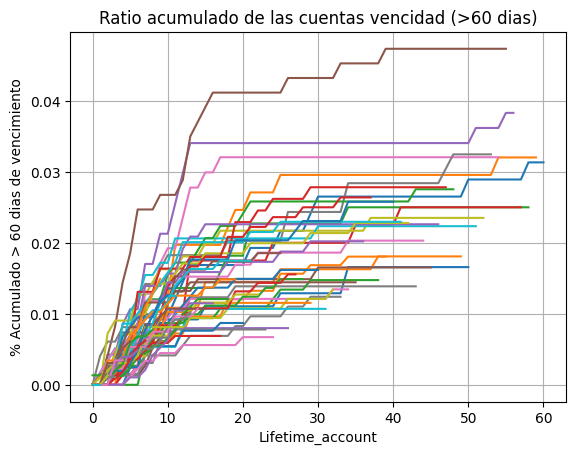

In [ ]:
# plot vintage line chart
plt.rcParams['figure.facecolor'] = 'white'
vintage0 = vintage_wide.replace(0,np.nan)
lst = [i for i in range(0,61)]
vintage_wide[lst].T.plot(legend = False, grid = True, title = 'Ratio acumulado de las cuentas vencidad (>60 dias)')
#plt.axvline(30)
#plt.axvline(25)
#plt.axvline(20)
plt.xlabel('Lifetime_account')
plt.ylabel('% Acumulado > 60 dias de vencimiento')
plt.show()

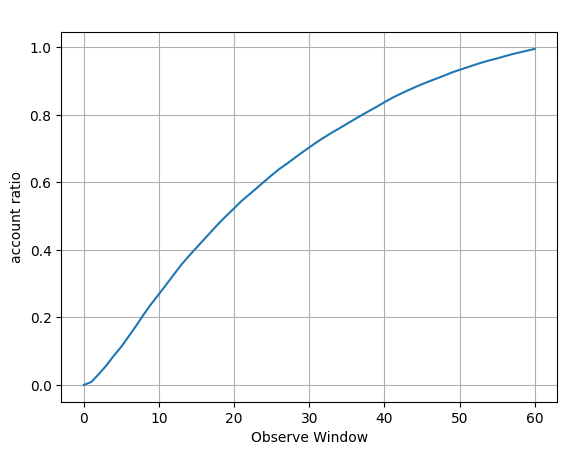

In [ ]:
#Determinamos que tiempo de observacion es necesario para poder identificar la totalidad de 
# los malos clientes.
lst = []
for i in range(0,61):
    ratio = len(pivot_tb[pivot_tb['window'] < i]) / len(set(pivot_tb['ID']))
    lst.append(ratio)
    
pd.Series(lst).plot(legend = False, grid = True, title = ' ')
plt.xlabel('Observe Window')
plt.ylabel('account ratio')
plt.show()

In [ ]:
def calculate_observe(credit, tipos_vencimiento):
    '''Calculo de la ventana observada
    '''
    id_sum = len(set(pivot_tb['ID']))
    credit['status'] = 0
    exec(tipos_vencimiento)
    #credit.loc[(credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1
    credit['month_on_book'] = credit['MONTHS_BALANCE'] - credit['open_month']
    minagg = credit[credit['status'] == 1].groupby('ID')['month_on_book'].min()
    minagg = pd.DataFrame(minagg)
    minagg['ID'] = minagg.index
    obslst = pd.DataFrame({'month_on_book':range(0,61), 'rate': None})
    lst = []
    for i in range(0,61):
        due = list(minagg[minagg['month_on_book']  == i]['ID'])
        lst.extend(due)
        obslst.loc[obslst['month_on_book'] == i, 'rate'] = len(set(lst)) / id_sum 
    return obslst['rate']

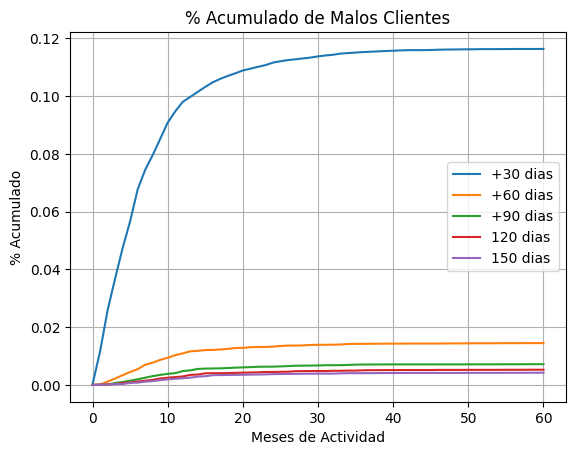

In [ ]:

# Cuantas malas cuentas se presentan por cada clasificación de mora
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '0') | (credit['STATUS'] == '1') | (credit['STATUS'] == '2') | (credit['STATUS'] == '3' )| (credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1"   
due_1 = calculate_observe(credit, tipos_vencimiento)
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '1') | (credit['STATUS'] == '2') | (credit['STATUS'] == '3' )| (credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1"   
due_30 = calculate_observe(credit, tipos_vencimiento)
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '2') | (credit['STATUS'] == '3' )| (credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1"
due_60 = calculate_observe(credit, tipos_vencimiento)
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '3' )| (credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1"
due_90 = calculate_observe(credit, tipos_vencimiento)
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '4' )| (credit['STATUS'] == '5'), 'status'] = 1"
due_120 = calculate_observe(credit, tipos_vencimiento)
tipos_vencimiento = "credit.loc[(credit['STATUS'] == '5'), 'status'] = 1"
due_150 = calculate_observe(credit, tipos_vencimiento)

obslst = pd.DataFrame({'+30 dias': due_30,
                       '+60 dias': due_60,
                       '+90 dias': due_90,
                       '120 dias': due_120,
                       '150 dias': due_150
                        })

obslst.plot(grid = True, title = '% Acumulado de Malos Clientes')
plt.xlabel('Meses de Actividad')
plt.ylabel('% Acumulado')
plt.show()

### **CONCLUSIONES:**
* La muestra final corresponde aproximada al 10%, de la base de datos de los applicantes a TC. 
* La muestra se podria ampliar para analizar mejor los casos.
* Segun en analisis de correlación realizado, no podemos determinar el riesgo de impago con ayuda de las caracteristicas socioeconomicas de los clientes(Probablemente por los filtros utilizados en el momento de aprobacion de la cuenta). Sin embargo, si existe una relación media con respecto a la antiguedad de las cuentas. Por lo cual, se utiliza el metodo de Mora Vintage para encontrar un patron de nuestro caso.
* Se aconseja realizar con mas metodos de analisis de correlación desarrollados para variables categoricas y booleanas.
